# COMPUTER LAB 3

Work through the "Third Computer Lab" (Chapter 9) in _A Student's Guide to Python._  This exercise illustrates how to work with images in Python.

You can use this notebook to store your code, plots, and notes, or you can write a ___script___ (see Section 3.3) that will carry out the analysis and produce the plots, and simply write your comments and observations in this notebook.  If you write a script, it should save your plots and images to PDF, JPG, or PNG files in this folder when it runs.

In [1]:
import scipy.ndimage as sim
# Standard setup
import numpy as np
import matplotlib.pyplot as plt
import cv2
# Get a random number generator.
from numpy.random import default_rng
rng = default_rng()
rand = rng.random
%matplotlib inline

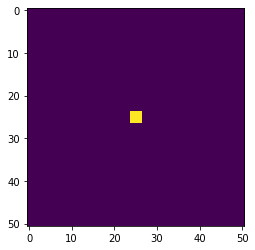

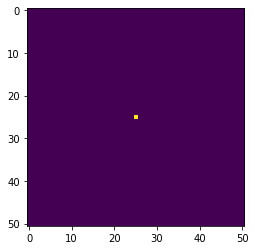

In [9]:
impulse = np.zeros( (51, 51) )
impulse[25, 25] = 1.0
my_filter = np.ones( (3, 3) ) / 9
response = sim.convolve(impulse, my_filter)
plt.figure()
_=plt.imshow(response)
plt.figure()
_=plt.imshow(impulse)

# 9.1.2 Averaging

## a

<Figure size 432x288 with 0 Axes>

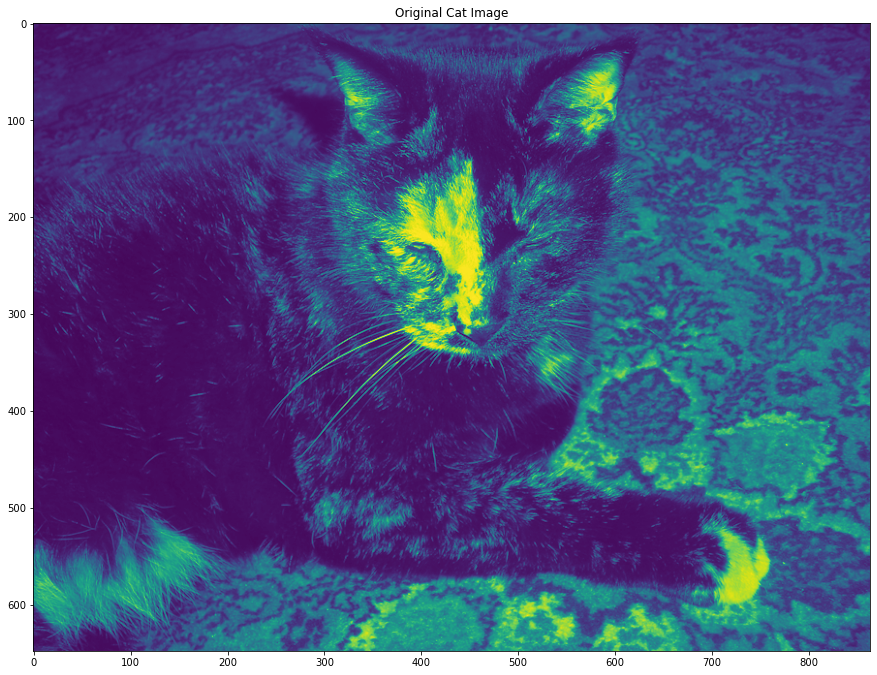

<Figure size 432x288 with 0 Axes>

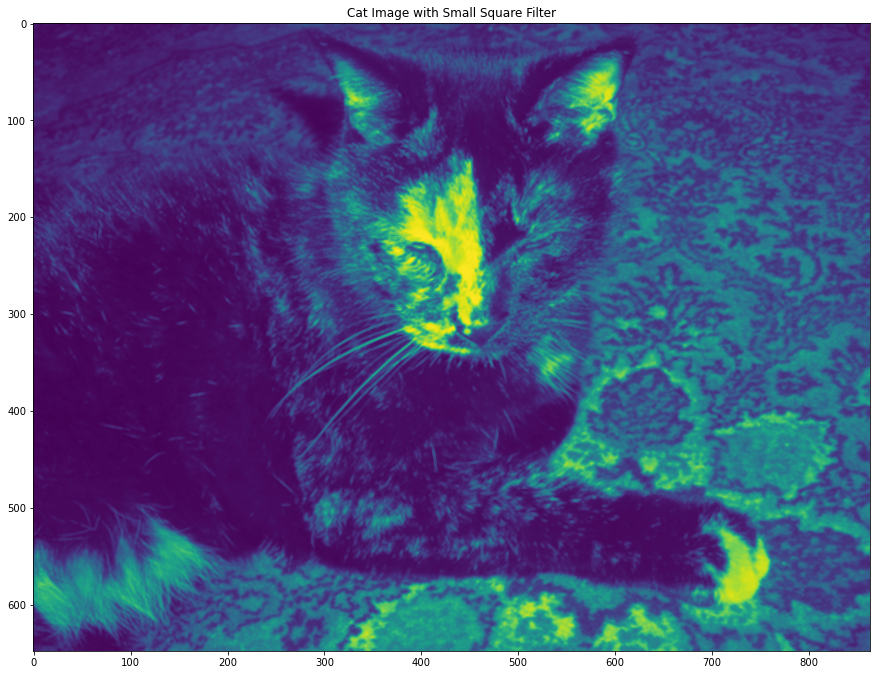

In [138]:
my_filter =np.array([1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9]).reshape(3,3)
cat = plt.imread("bwCat.tif")
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat)
_=plt.title('Original Cat Image')
cat_filter = sim.convolve(cat, my_filter)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat_filter)
_=plt.title('Cat Image with Small Square Filter')

The image looks 'fuzzier', or blurrier than the original image.

<Figure size 432x288 with 0 Axes>

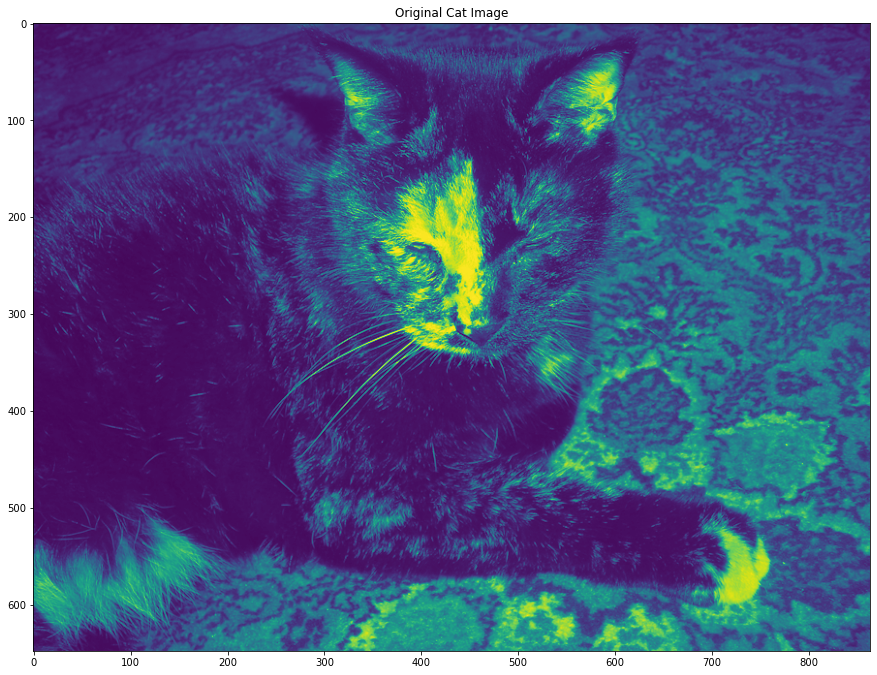

<Figure size 432x288 with 0 Axes>

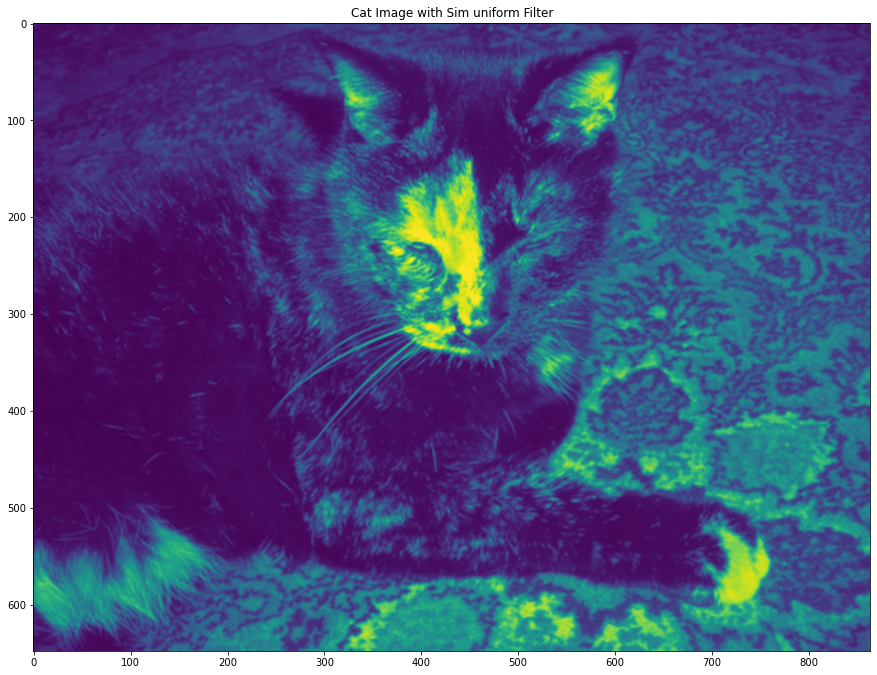

In [139]:
cat = plt.imread("bwCat.tif")
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat)
_=plt.title('Original Cat Image')
cat_filter = sim.uniform_filter(cat)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat_filter)
_=plt.title('Cat Image with Sim uniform Filter')

Seems pretty similar to me using the sim.uniform_filter function.  Overall the resulting image is slightly fuzzy.

## b

<Figure size 432x288 with 0 Axes>

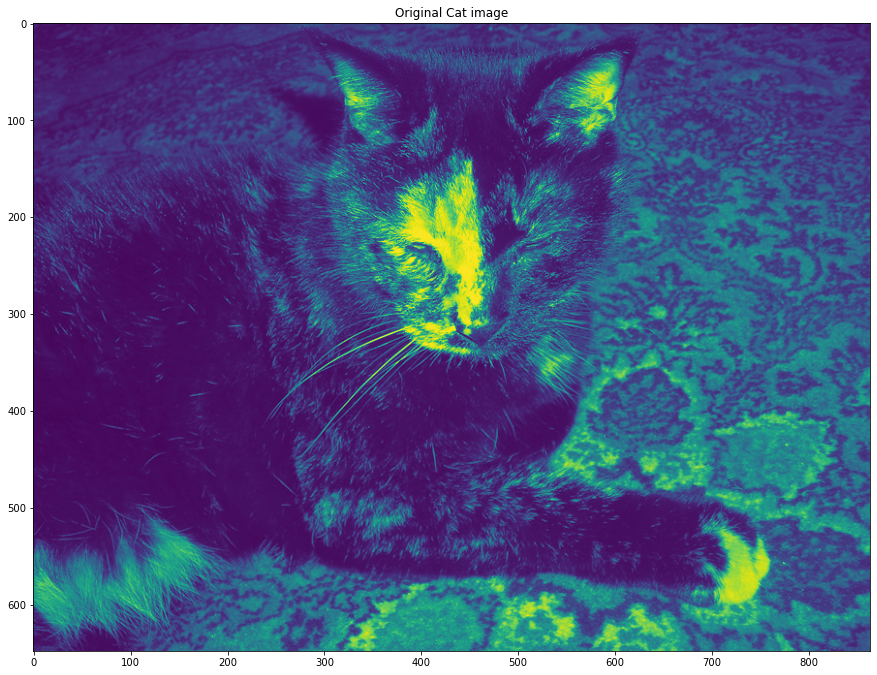

<Figure size 432x288 with 0 Axes>

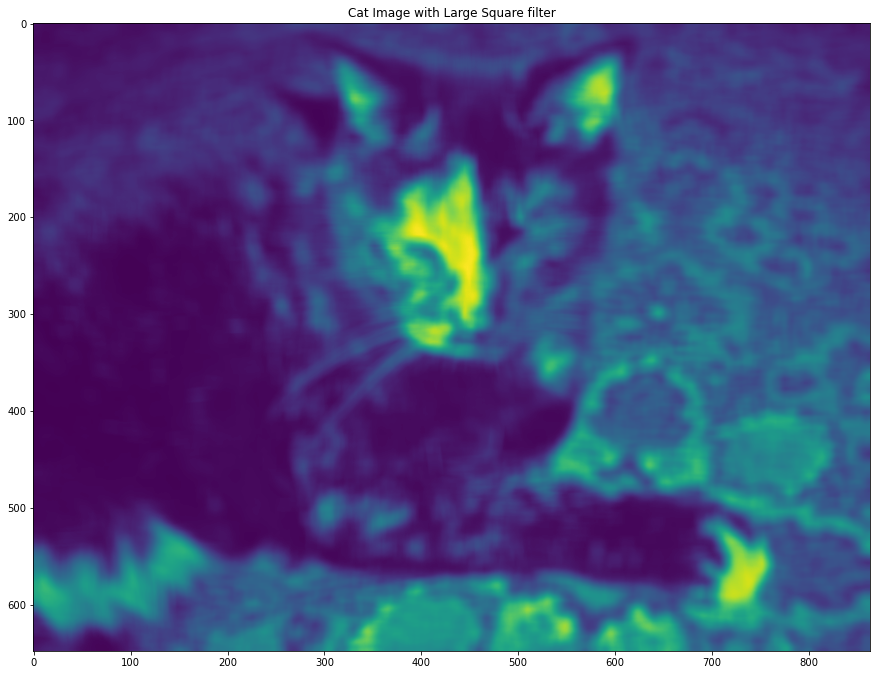

In [140]:
my_filter15 =np.full((15, 15), 1/225)
cat = plt.imread("bwCat.tif")
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat)
_=plt.title('Original Cat image')
cat_filter = sim.convolve(cat, my_filter15)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat_filter)
_=plt.title('Cat Image with Large Square filter')

It's even more blurred than when using the smaller filter.

## c

Convolution is difficult to explain in text.  Essentially the filter matrix is being reversed and 'convolved' over the second matrix, which is the image.  Using the indices of the arrays the reversed filter matrix is being multiplied against consecutive indices which creates new values.  When the convolution is complete we end up with the resulting blurry image in this case.  I believe this is due to the averaging of all of the pixel values.

# 9.1.3
## a

<Figure size 432x288 with 0 Axes>

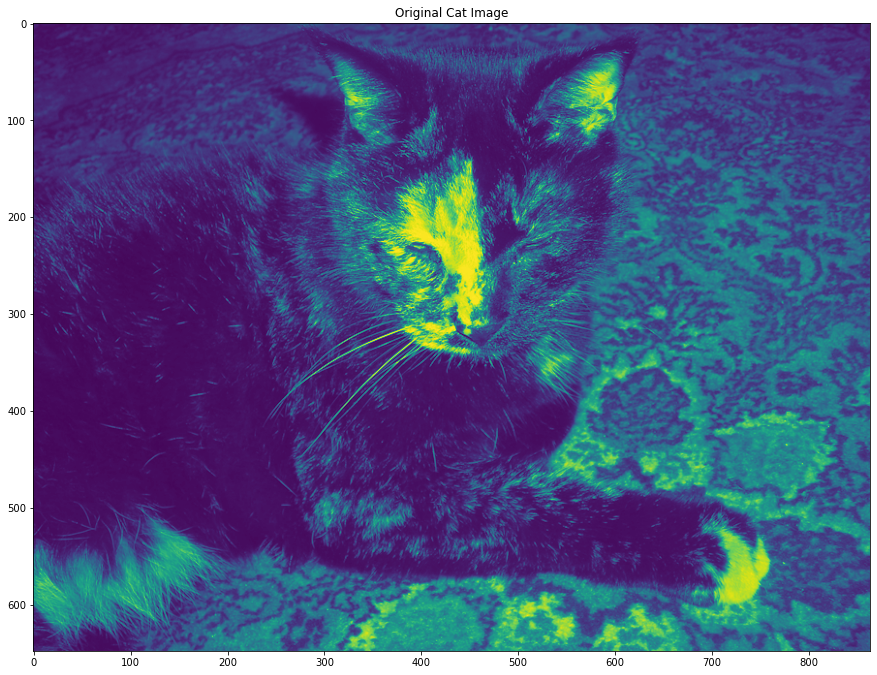

<Figure size 432x288 with 0 Axes>

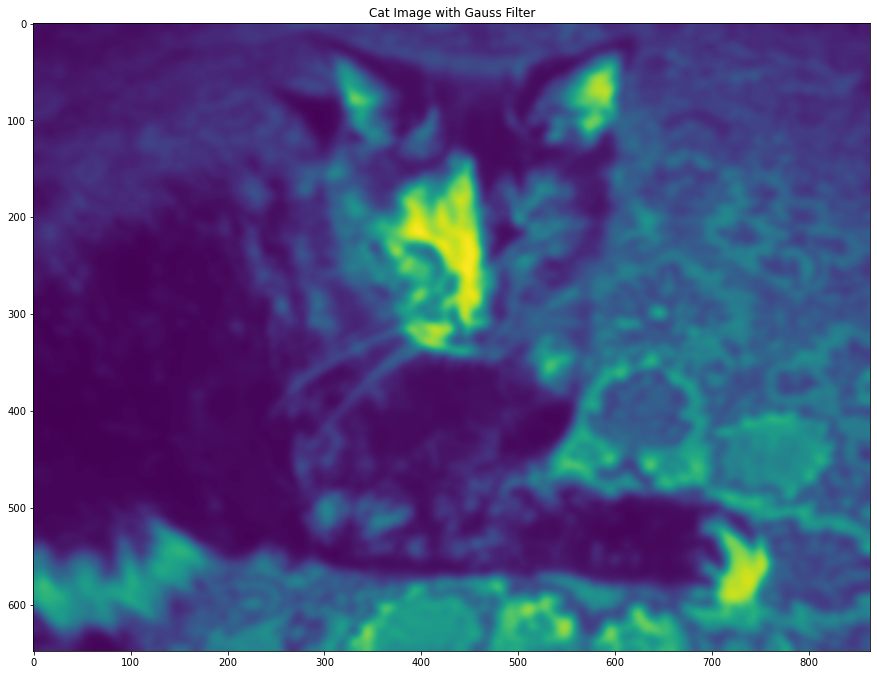

In [141]:
guass_filter = np.loadtxt('gauss_filter.csv', delimiter = ',', dtype = float)
cat = plt.imread("bwCat.tif")
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat)
_=plt.title('Original Cat Image')
cat_filter = sim.convolve(cat, guass_filter)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat_filter)
_=plt.title('Cat Image with Gauss Filter')

<Figure size 432x288 with 0 Axes>

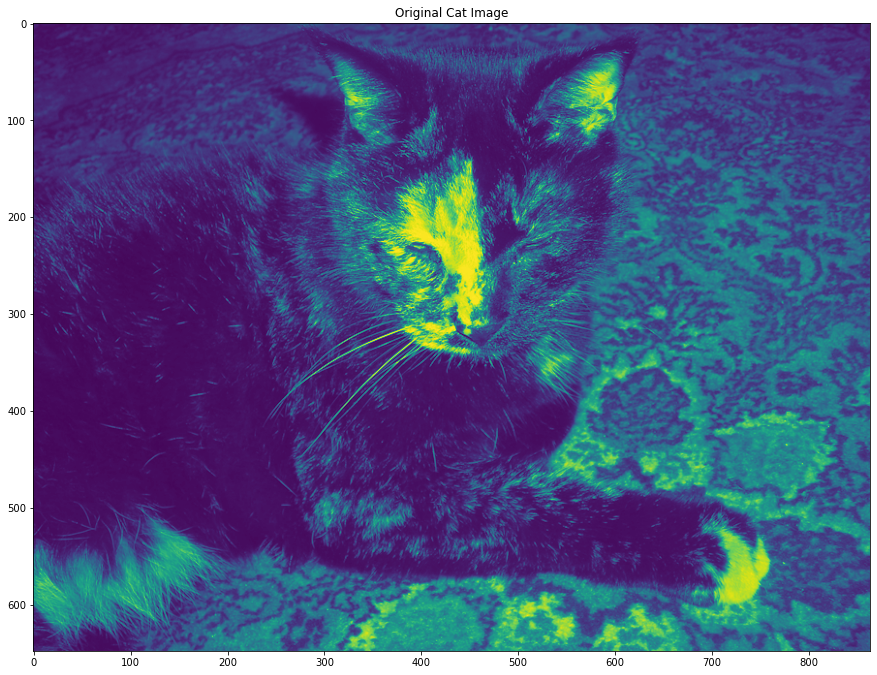

<Figure size 432x288 with 0 Axes>

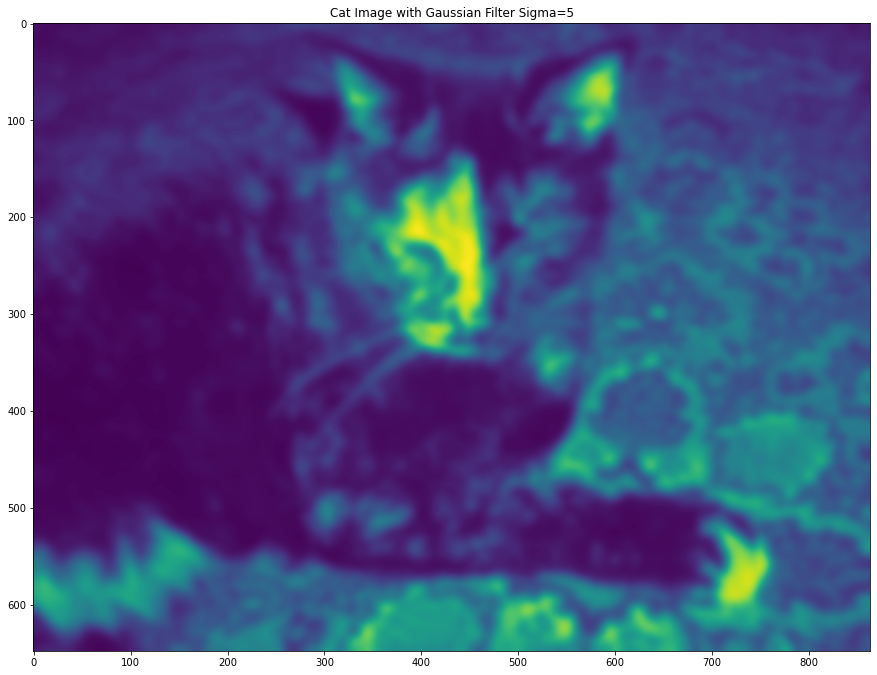

In [142]:
cat = plt.imread("bwCat.tif")
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat)
_=plt.title('Original Cat Image')
cat_filter = sim.gaussian_filter(cat,sigma=5)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat_filter)
_=plt.title('Cat Image with Gaussian Filter Sigma=5')

## b

Text(0.5, 1.0, 'Guassian Filter')

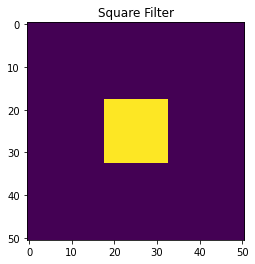

<Figure size 432x288 with 0 Axes>

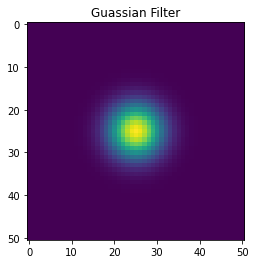

In [15]:
impulse = np.zeros( (51, 51) )
impulse[25, 25] = 1.0
my_filter =np.full((15, 15), 1/225)
response = sim.convolve(impulse, my_filter)
plt.figure()
_=plt.imshow(response)
plt.title("Square Filter")
impulse_filter = sim.convolve(impulse, guass_filter)
plt.figure()
plt.figure(figsize=(4,4))
_=plt.imshow(impulse_filter)
plt.title("Guassian Filter")

## c

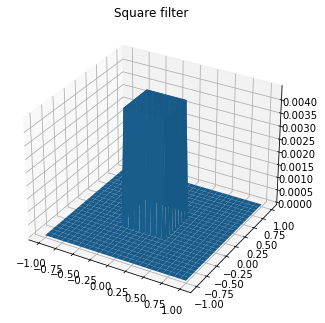

In [16]:
from mpl_toolkits.mplot3d import Axes3D

points1 = np.linspace(-1, 1, 51)
points2 = np.linspace(-1, 1, 51)
X, Y = np.meshgrid(points1, points2)
Z = sim.convolve(impulse, my_filter)
ax = Axes3D(plt.figure())
ax.plot_surface(X, Y, Z)
_=plt.title("Square filter")

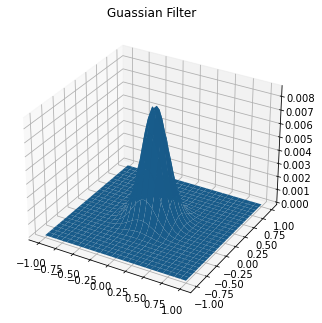

In [17]:
points1 = np.linspace(-1, 1, 51)
points2 = np.linspace(-1, 1, 51)
X, Y = np.meshgrid(points1, points2)
Z = sim.convolve(impulse,guass_filter)
ax = Axes3D(plt.figure())
ax.plot_surface(X, Y, Z)
_=plt.title("Guassian Filter")

The biggest difference between square/mean filters and guassian filters is the way it averages pixels.  Guassian filters essentially weights everything around a central point taking into account distance from center, while square filters are just an average of the surrounding points.

Guassian filters do a much better job of separating frequencies than square filters but it's much slower to implement.  From what I remember of DSP I believe running a square filter numerous times will essentially replicate a guassian filter, and depending on implementation it might actually be much faster to run the square filter numerous times.

# 8.2

## a

In [250]:
noise = np.random.rand(648,864)
noise_cat = np.multiply(cat, noise)
noise_cat = cv2.normalize(noise_cat, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)

noise_cat = noise_cat.astype(np.uint8)

<Figure size 432x288 with 0 Axes>

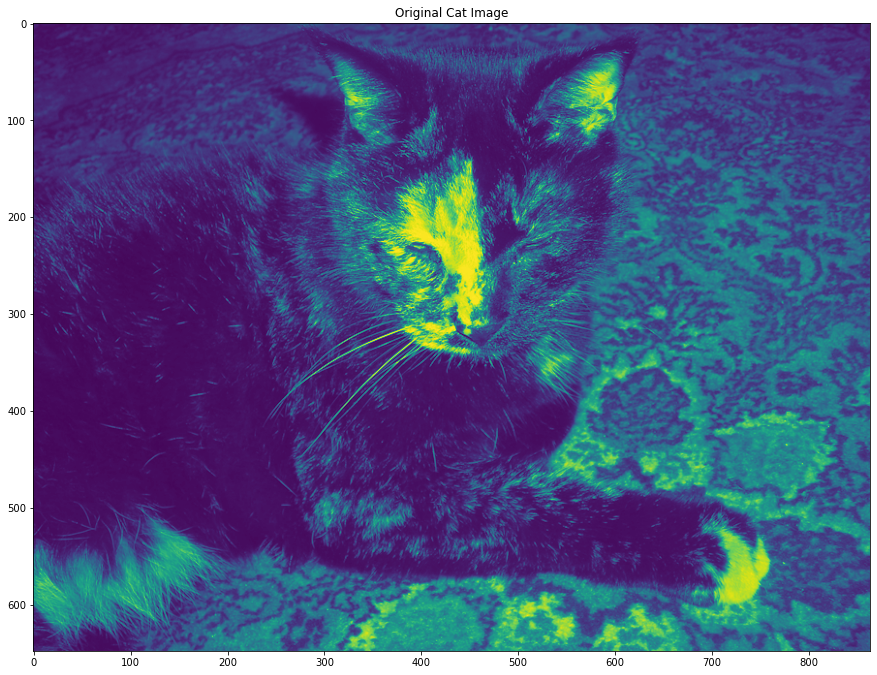

<Figure size 432x288 with 0 Axes>

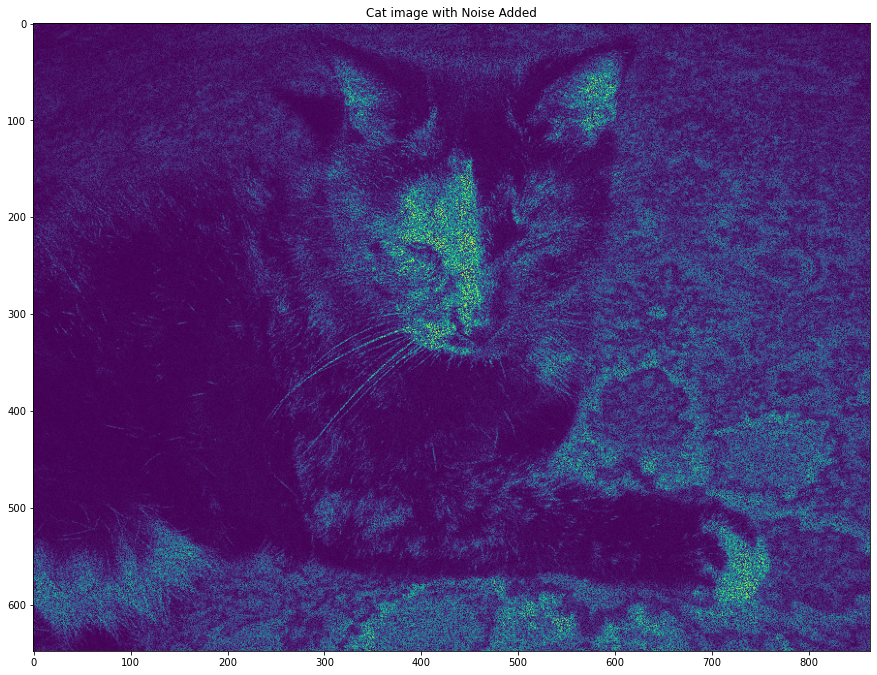

In [228]:
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat)
_=plt.title("Original Cat Image")

_=plt.figure()
_=plt.figure(figsize=(15,15))
_=plt.imshow(noise_cat)
_=plt.title("Cat image with Noise Added")

The noisy image is definitely darker and grainier than the original.


## b

<Figure size 432x288 with 0 Axes>

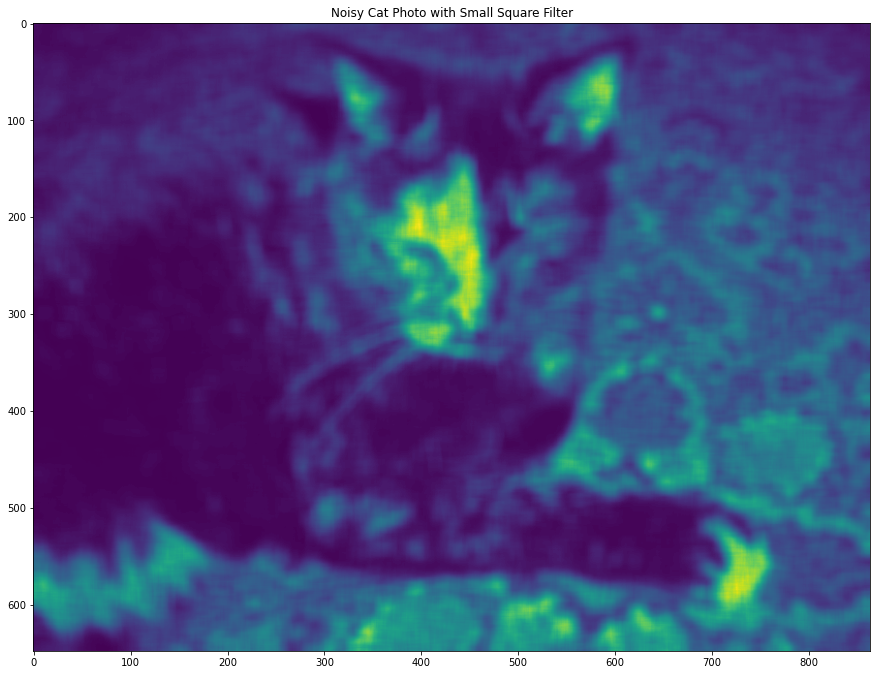

<Figure size 432x288 with 0 Axes>

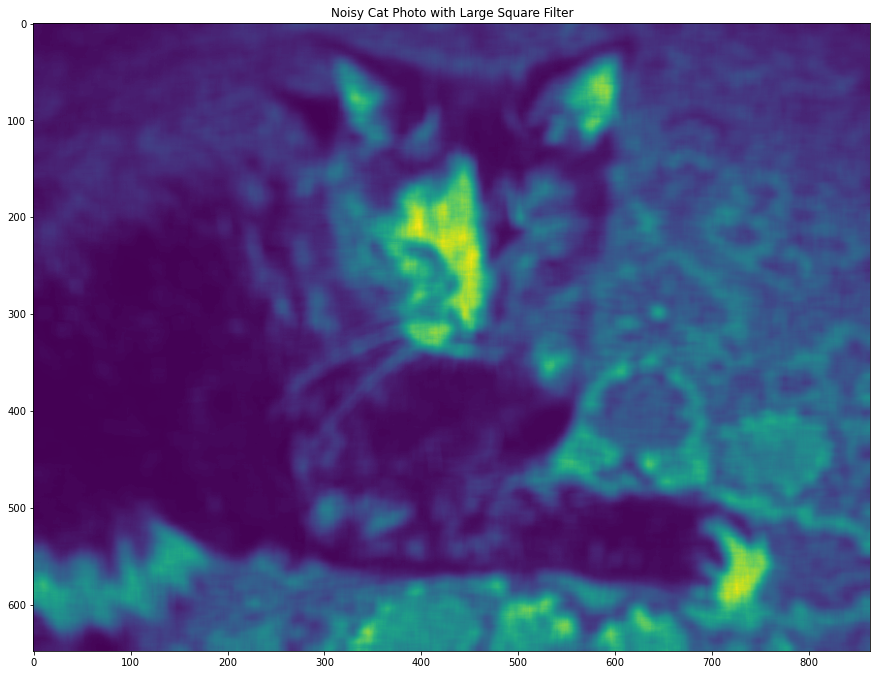

<Figure size 432x288 with 0 Axes>

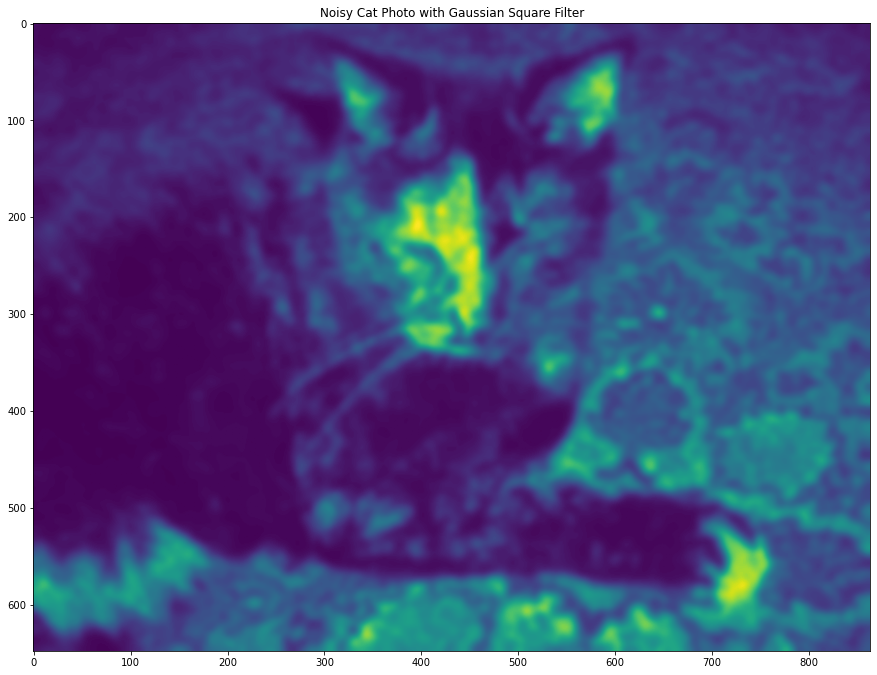

In [251]:
cat_filter = sim.convolve(noise_cat, my_filter)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat_filter)
_=plt.title("Noisy Cat Photo with Small Square Filter")

cat_filter15 = sim.convolve(noise_cat, my_filter15)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat_filter15)
_=plt.title("Noisy Cat Photo with Large Square Filter")

cat_filtergauss = sim.convolve(noise_cat, guass_filter)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(cat_filtergauss)
_=plt.title("Noisy Cat Photo with Gaussian Square Filter")

Text(0.5, 1.0, 'Gaussian Filter')

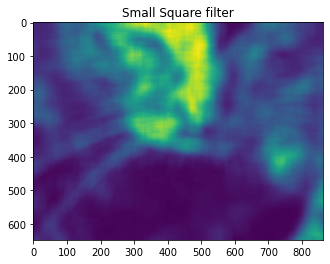

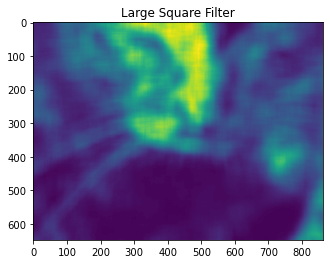

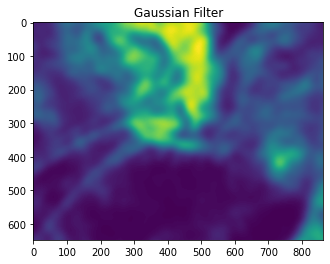

In [259]:
small_square_zoom = clipped_zoom(cat_filter, 3.0)
large_square_zoom = clipped_zoom(cat_filter15, 3.0)
gaussian_zoom = clipped_zoom(cat_filtergauss, 3.0)

plt.figure()
plt.imshow(small_square_zoom)
plt.title("Small Square filter")
plt.figure()
plt.imshow(large_square_zoom)
plt.title("Large Square Filter")
plt.figure()
plt.imshow(gaussian_zoom)
plt.title("Gaussian Filter")

I'm not sure I would say the filters make it look better.  They do certainly remove a lot of the noise that was inserted into the image, but they still blur everything out.

If I had to pick one I would use the gaussian filter as it provides the smoothest image overall.

# 8.3

## a

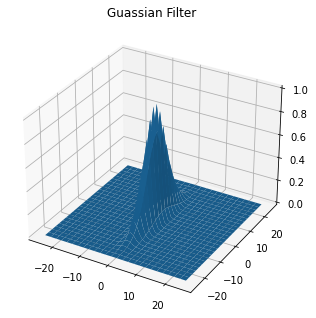

In [134]:
v = np.arange(-25, 26)
X, Y = np.meshgrid(v, v)
gauss_filter = np.exp(-0.5*(X**2/2 + Y**2/45))
Z = gauss_filter
ax = Axes3D(plt.figure())
ax.plot_surface(X, Y, Z)
_=plt.title("Guassian Filter")

## b

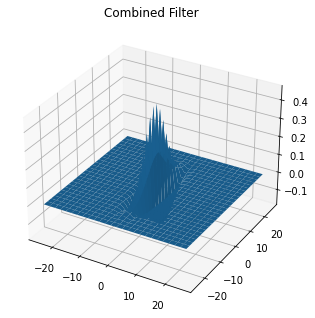

In [129]:
laplace_filter = np.array( [ [0, -1, 0], [-1, 4, -1], [0, -1, 0] ] )
combined_filter = sim.convolve(gauss_filter, laplace_filter)
Z = combined_filter
ax = Axes3D(plt.figure())
ax.plot_surface(X, Y, Z)
_=plt.title("Combined Filter")

The combined filter visually appears more jagged, there's more peaks and valleys.  It also only reaches a value of roughly 1/2 the peak of the guassian filter.  However the shape is pretty similar overall.

## c

<Figure size 432x288 with 0 Axes>

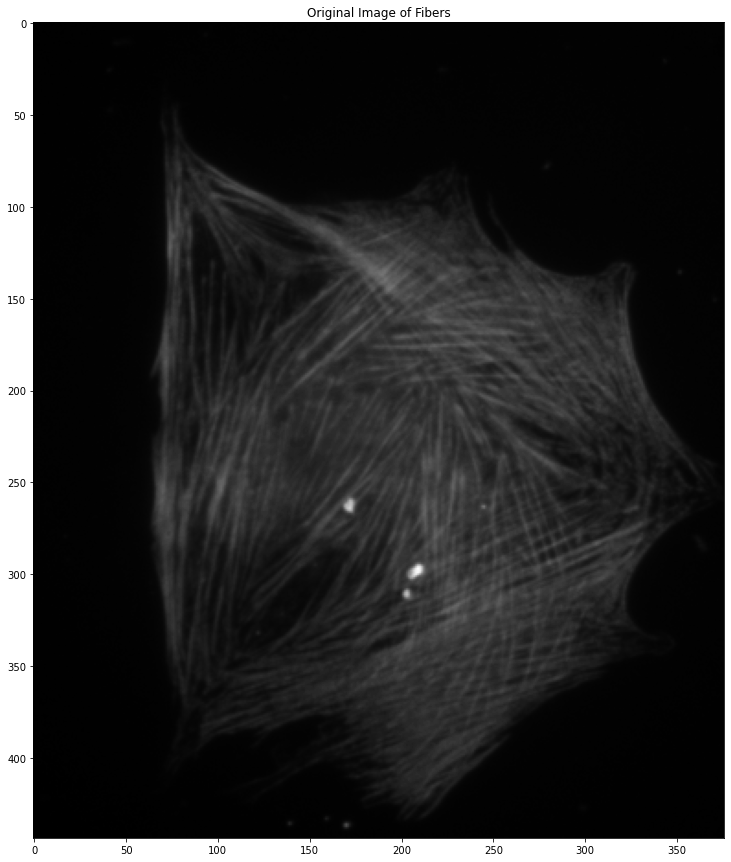

<Figure size 432x288 with 0 Axes>

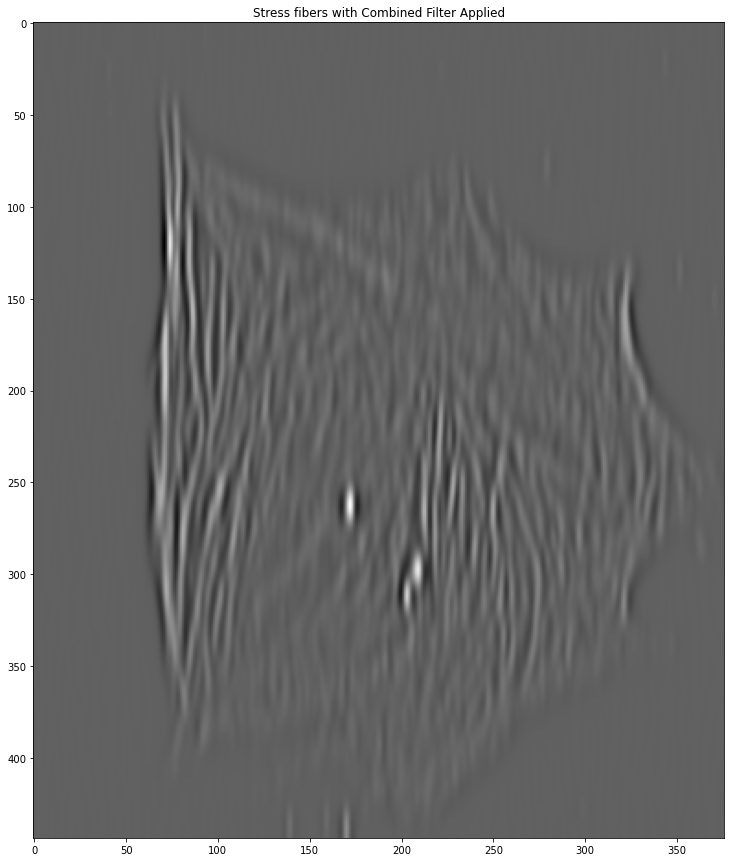

In [131]:
#my_data = genfromtxt('stressFibers.csv', delimiter=',')
#plt.imsave('output.png', my_data, cmap='gray')
#fibers = plt.imread("output.png")
# Couldn't get this to work with the .csv file.  I was able to import and display
# the image, but the shape was really weird, couldn't be filtered.
fibers = np.load('stressFibers.npy')
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(fibers, cmap = 'gray')
plt.title("Original Image of Fibers")

fiber_filter = sim.convolve(fibers, combined_filter)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(fiber_filter, cmap = 'gray')
_=plt.title("Stress fibers with Combined Filter Applied")

The resulting image looks a bit blurry compared to the original.  I can definitely see where the edges seem to be more highlighted than in the original image.  I also am noticing the lack of contrast in the image, everything is a similar shade of grey.

## d

<Figure size 432x288 with 0 Axes>

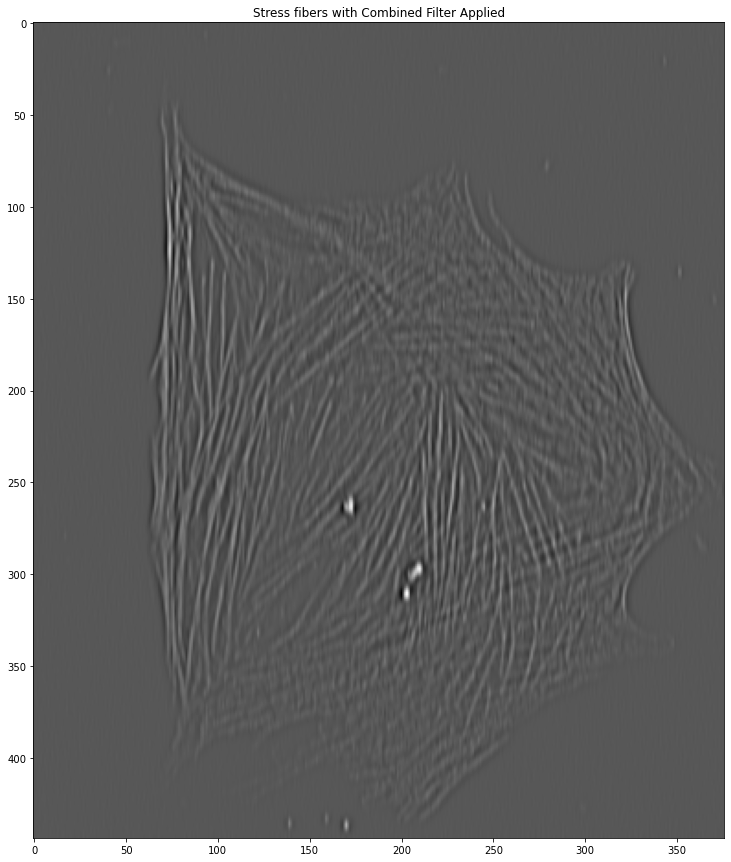

In [137]:
v = np.arange(-25, 26)
X, Y = np.meshgrid(v, v)
gauss_filter = np.exp(-5*(X**2/2 + Y**2/45))
laplace_filter = np.array( [ [0, -1, 0], [-1, 4, -1], [0, -1, 0] ] )
combined_filter = sim.convolve(gauss_filter, laplace_filter)

fiber_filter = sim.convolve(fibers, combined_filter)
plt.figure()
plt.figure(figsize=(15,15))
_=plt.imshow(fiber_filter, cmap = 'gray')
_=plt.title("Stress fibers with Combined Filter Applied")

I changed the initial value in the gaussian filter for this image, I think that's what the question was asking?

This actually looks pretty good, I can more clearly see the individual lines or fibers in the image.

In [233]:
import numpy as np
from scipy.ndimage import zoom

def clipped_zoom(img, zoom_factor, **kwargs):

    h, w = img.shape[:2]

    zoom_tuple = (zoom_factor,) * 2 + (1,) * (img.ndim - 2)

    if zoom_factor < 1:
 
        zh = int(np.round(h * zoom_factor))
        zw = int(np.round(w * zoom_factor))
        top = (h - zh) // 2
        left = (w - zw) // 2

        out = np.zeros_like(img)
        out[top:top+zh, left:left+zw] = zoom(img, zoom_tuple, **kwargs)


    elif zoom_factor > 1:

        zh = int(np.round(h / zoom_factor))
        zw = int(np.round(w / zoom_factor))
        top = (h - zh) // 2
        left = (w - zw) // 2

        out = zoom(img[top:top+zh, left:left+zw], zoom_tuple, **kwargs)

        trim_top = ((out.shape[0] - h) // 2)
        trim_left = ((out.shape[1] - w) // 2)
        out = out[trim_top:trim_top+h, trim_left:trim_left+w]

    else:
        out = img
    return out